In [20]:
import os
os.environ["PATH"] = "/opt/homebrew/bin/:" + os.environ["PATH"]

In [32]:
api_key = os.environ["UPSTAGE_API_KEY"]

In [73]:
import json
import shutil
import requests
from PIL import Image
from PyPDF2 import PdfReader, PdfWriter
from pdf2image import convert_from_path

def pdf_to_images(pdf_file_path, root_path):
    images = convert_from_path(pdf_file_path)
    image_paths = []

    for i, image in enumerate(images):
        image_path = f"{root_path}/{i+1}.png"
        image.save(image_path)
        image_paths.append(image_path)

    return image_paths

def get_document_parse_response(filename, api_key):
    url = "https://api.upstage.ai/v1/document-ai/document-parse"

    headers = {"Authorization": f"Bearer {api_key}"}
    files = {"document": open(filename, "rb")}
    data = {"output_formats": "['markdown']"}

    response = requests.post(url, headers=headers, files=files, data=data)
    upstage_response = json.loads(response.text)
    return upstage_response

def calc_original_coordinates(coordinate, width, height):
    x_coords = [coord['x'] for coord in coordinate]
    y_coords = [coord['y'] for coord in coordinate]

    # Calculate top-left and bottom-right
    top_left = {'x': min(x_coords), 'y': min(y_coords)}
    bottom_right = {'x': max(x_coords), 'y': max(y_coords)}

    left = int(top_left['x'] * width)
    top = int(top_left['y'] * height)
    right = int(bottom_right['x'] * width)
    bottom = int(bottom_right['y'] * height)

    return left, top, right, bottom

def get_images_from_upstage_response(upstage_response, root_path, offset=0, multiplier=10):
    cropped_imgs = []
    
    if "elements" in upstage_response:
        for d in upstage_response["elements"]:
            if d["category"] == "chart" or d["category"] == "table" or d["category"] == "figure":
                page_number = d["page"]
                coordinates = d["coordinates"]
                
                filename = offset*multiplier + page_number
                img = Image.open(f"{root_path}/{filename}.png")
                # Convert normalized coordinates to pixel values
                left, top, right, bottom = calc_original_coordinates(
                    coordinates, img.size[0], img.size[1]
                )
                
                # Crop the image
                cropped_img = img.crop((left, top, right, bottom))
                cropped_imgs.append(cropped_img)

    return cropped_imgs

def split_pdf_by_pages(input_pdf_path, root_path, pages_per_pdf=10):
    # Open the PDF
    pdf = PdfReader(input_pdf_path)
    total_pages = len(pdf.pages)
    
    # Calculate number of output PDFs needed
    num_pdfs = (total_pages + pages_per_pdf - 1) // pages_per_pdf
    
    output_paths = []
    
    # Create output directory using input filename
    base_name = os.path.splitext(input_pdf_path)[0]
    os.makedirs(base_name, exist_ok=True)
    
    # Split into multiple PDFs
    for i in range(num_pdfs):
        writer = PdfWriter()
        
        # Calculate start and end pages for this split
        start_page = i * pages_per_pdf
        end_page = min((i + 1) * pages_per_pdf, total_pages)
        
        # Add pages to writer
        for page_num in range(start_page, end_page):
            writer.add_page(pdf.pages[page_num])
            
        # Save the split PDF
        output_path = f"{root_path}/{i+1}.pdf"
        with open(output_path, "wb") as output_file:
            writer.write(output_file)
        output_paths.append(output_path)
        
    return output_paths



{'api': '2.0', 'content': {'html': '', 'markdown': '2025-02-05\n\n# Matryoshka Quantization\n\nPranav Nair*,1, Puranjay Datta*,1, Jeff Dean1, Prateek Jain1 and Aditya Kusupati1\n1Google DeepMind, *Equal contribution\n\nQuantizing model weights is critical for reducing the communication and inference costs of large models.\nHowever, quantizing models – especially to low precisions like int4 or int2 – requires a trade-off in model\nquality; int2, in particular, is known to severely degrade model quality. Consequently, practitioners are\noften forced to maintain multiple models with different quantization levels or serve a single model that\nbest satisfies the quality-latency trade-off. On the other hand, integer data types, such as int8, inherently\npossess a nested (Matryoshka) structure where smaller bit-width integers, like int4 or int2, are nested\nwithin the most significant bits. This paper proposes Matryoshka Quantization (MatQuant), a novel\nmulti-scale quantization technique tha

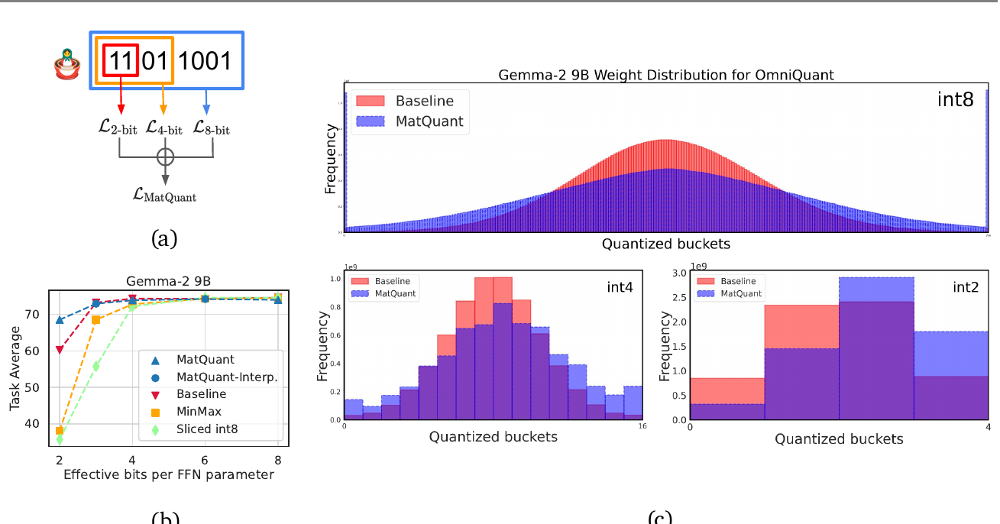

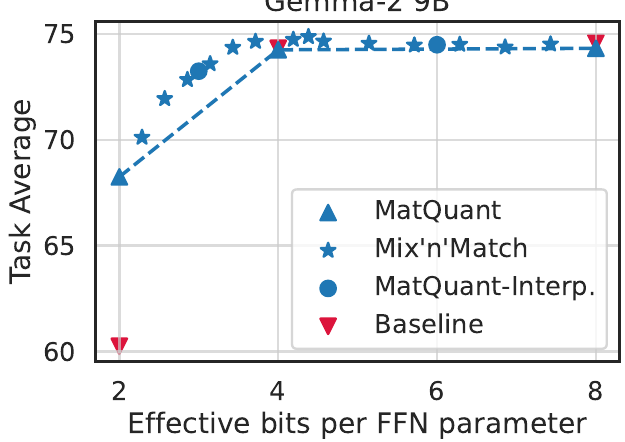

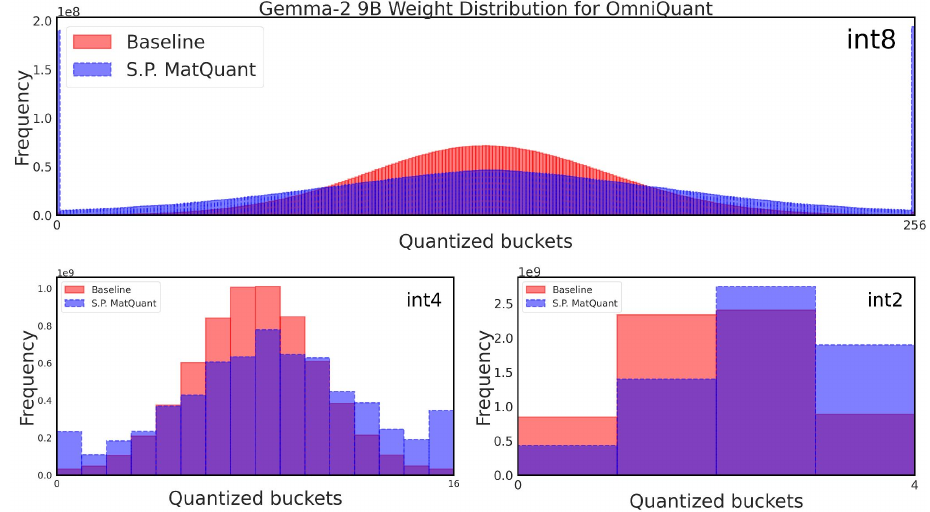

In [ ]:
filename = "Matryoshka Quantization.pdf"
root_path = "mat"

shutil.rmtree(root_path, ignore_errors=True)
os.makedirs(root_path, exist_ok=True)

image_paths = pdf_to_images(filename, root_path)
split_pdfs = split_pdf_by_pages(filename, root_path) # by 10

images = []
for i, split_pdf in enumerate(split_pdfs):
    upstage_response = get_document_parse_response(split_pdf, api_key)
    sub_images = get_images_from_upstage_response(upstage_response, root_path, offset=i)
    images.extend(sub_images)
    
for image in images:
    display(image)

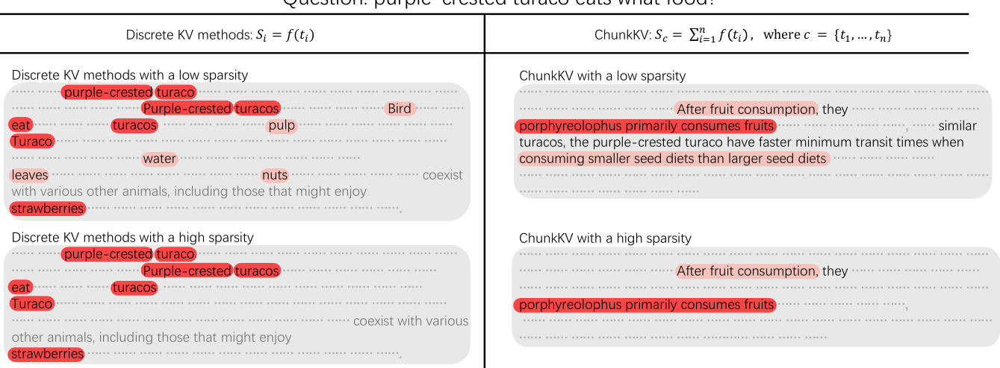

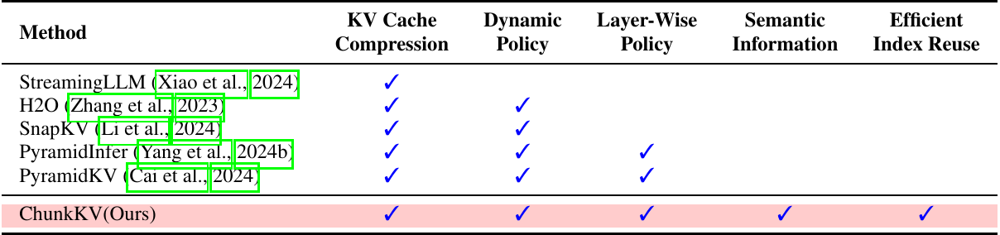

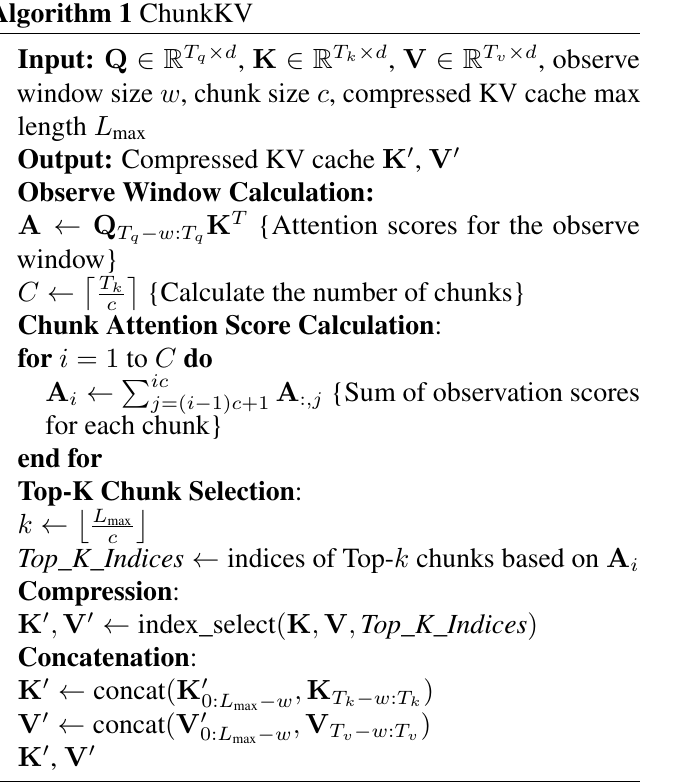

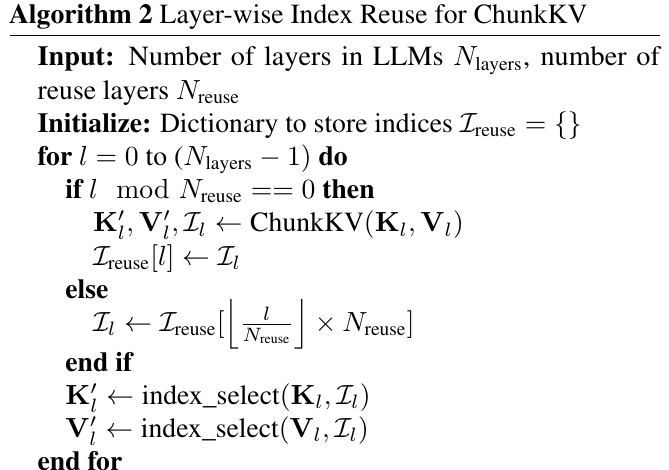

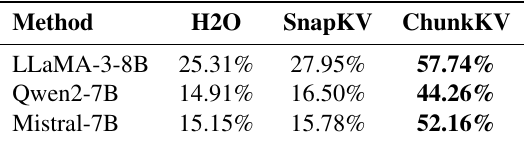

...

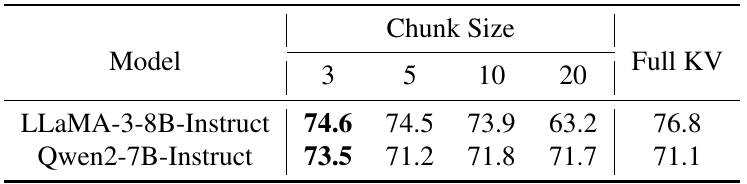

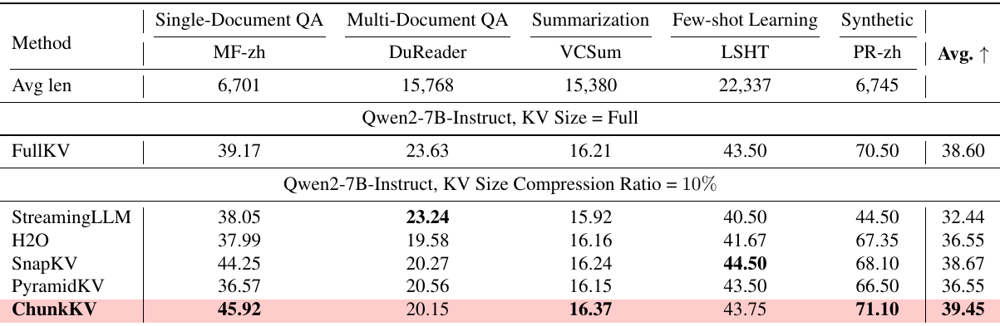

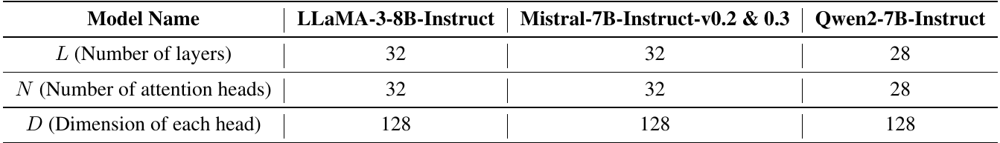

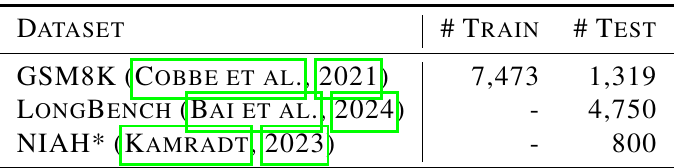

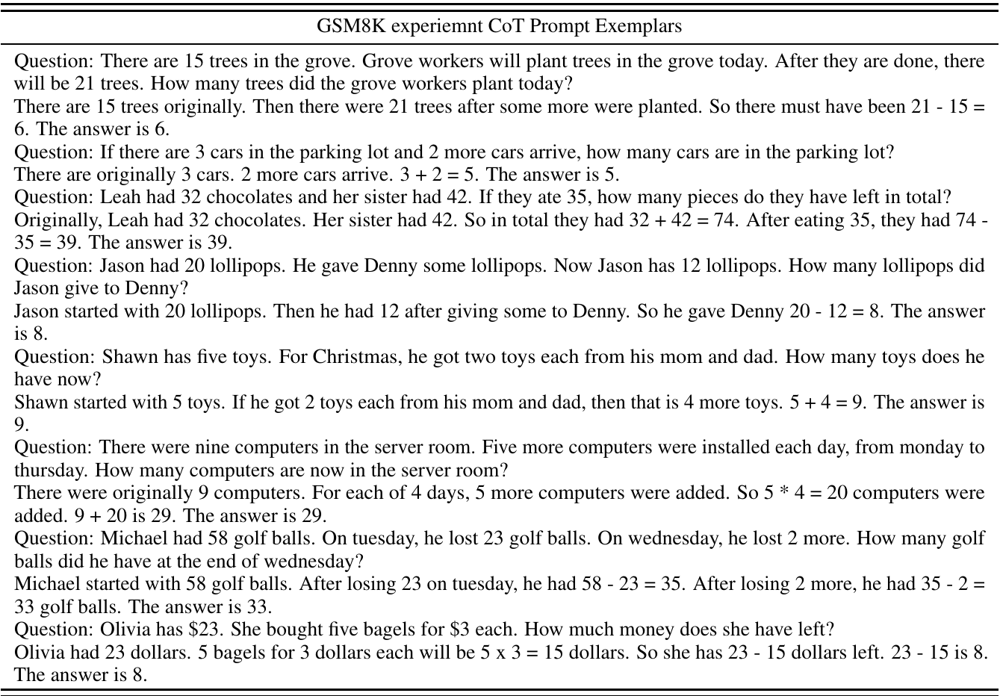

In [74]:
filename = "ChunkKV - Semantic-Preserving KV Cache Compression for Efficient Long-Context LLM Inference.pdf"
root_path = "chunk_kv"

shutil.rmtree(root_path, ignore_errors=True)
os.makedirs(root_path, exist_ok=True)

image_paths = pdf_to_images(filename, root_path)
split_pdfs = split_pdf_by_pages(filename, root_path, pages_per_pdf=1)

images = []
for i, split_pdf in enumerate(split_pdfs):
    upstage_response = get_document_parse_response(split_pdf, api_key)
    sub_images = get_images_from_upstage_response(upstage_response, root_path, offset=i, multiplier=1)
    images.extend(sub_images)
    
for image in images:
    display(image)